In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("karanwxlia/underwater-trash-detection")

print("Path to dataset files:", path)

100%|██████████| 213M/213M [00:03<00:00, 57.9MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1


In [ ]:
# Install ultralytics package (YOLOv8)
!pip install ultralytics
import ultralytics
ultralytics.checks()


Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.5/107.7 GB disk)


In [ ]:
import os
dataset_path = "/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1"
print(os.listdir(dataset_path))


['utd2.v8i.coco', 'utd2.v8i.tensorflow', 'utd2.v8i.yolov8']


In [ ]:
DATASET_PATH = "/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8"


In [ ]:
import os
print(os.listdir(DATASET_PATH))


['train', 'data.yaml', 'valid', 'test', 'README.roboflow.txt', 'README.dataset.txt']


In [ ]:
import os
import shutil
import numpy as np
from sklearn.model_selection import KFold

# Paths
images_path = os.path.join(DATASET_PATH, "train", "images")
labels_path = os.path.join(DATASET_PATH, "train", "labels")
output_dir = os.path.join(DATASET_PATH, "kfold_splits")

# Create output directory
os.makedirs(output_dir, exist_ok=True)

# Get all image filenames
image_files = sorted([f for f in os.listdir(images_path) if f.endswith(('.jpg', '.png', '.jpeg'))])

# Perform 5-fold split
kf = KFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(kf.split(image_files)):
    fold_dir = os.path.join(output_dir, f"fold_{fold}")
    os.makedirs(fold_dir, exist_ok=True)

    # Train and val folders
    train_images_dir = os.path.join(fold_dir, "train", "images")
    train_labels_dir = os.path.join(fold_dir, "train", "labels")
    val_images_dir = os.path.join(fold_dir, "valid", "images")
    val_labels_dir = os.path.join(fold_dir, "valid", "labels")

    for d in [train_images_dir, train_labels_dir, val_images_dir, val_labels_dir]:
        os.makedirs(d, exist_ok=True)

    # Move files
    for idx in train_idx:
        shutil.copy(os.path.join(images_path, image_files[idx]), train_images_dir)
        shutil.copy(os.path.join(labels_path, image_files[idx].replace(".jpg", ".txt")), train_labels_dir)

    for idx in val_idx:
        shutil.copy(os.path.join(images_path, image_files[idx]), val_images_dir)
        shutil.copy(os.path.join(labels_path, image_files[idx].replace(".jpg", ".txt")), val_labels_dir)

    print(f"✅ Fold {fold} created!")


✅ Fold 0 created!
✅ Fold 1 created!
✅ Fold 2 created!
✅ Fold 3 created!
✅ Fold 4 created!


In [ ]:
ls /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/


train/  valid/


In [ ]:
import yaml

# Define the YAML content as a dictionary
yaml_content = {
    "path": "/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0",
    "train": "images/train",
    "val": "images/val",
    "nc": 3,  # Number of classes
    "names": ["class_0", "class_1", "class_2"]
}

# Save YAML content to a file
yaml_file_path = "data.yaml"
with open(yaml_file_path, "w") as yaml_file:
    yaml.dump(yaml_content, yaml_file, default_flow_style=False)

print(f"YAML file saved successfully at: {yaml_file_path}")


YAML file saved successfully at: data.yaml


In [ ]:
import os

data_yaml_path = "/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml"

# Check if the file exists
if os.path.exists(data_yaml_path):
    print(f"✅ data.yaml exists at: {data_yaml_path}")
else:
    print(f"❌ data.yaml is missing at: {data_yaml_path}")


❌ data.yaml is missing at: /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml


In [ ]:
data_yaml_path = "/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml"

data_yaml_content = """\
path: /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0
train: images/train
val: images/val
nc: 3  # number of classes
names: ["class_0", "class_1", "class_2"]
"""

# Create directory if it doesn't exist
import os

os.makedirs(os.path.dirname(data_yaml_path), exist_ok=True)

# Save the file
with open(data_yaml_path, "w") as f:
    f.write(data_yaml_content)

print(f"✅ YAML file saved successfully at: {data_yaml_path}")


✅ YAML file saved successfully at: /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml


In [ ]:
ls -R /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/

Streaming output truncated to the last 5000 lines.
obj1061_frame0000159_jpg.rf.06a33807ebf523d29c47f490d79806eb.txt
obj1061_frame0000161_jpg.rf.6a553b332a70337fb94a3bf1d46bb5b8.txt
obj1064_frame0000026_jpg.rf.3ea566aa64963c44a0b68211ccab0d1b.txt
obj1064_frame0000038_jpg.rf.65a7dce9893ce3bc3632667b1447abd8.txt
obj1064_frame0000041_jpg.rf.ae9ba333ffe27201698e4fe2c3d4ec65.txt
obj1064_frame0000046_jpg.rf.8b4556c88251cd845b822ab17032c770.txt
obj1064_frame0000056_jpg.rf.41de61c5943d1758729f7f43fe66e6e0.txt
obj1073_frame0000026_jpg.rf.a357ba6492cdc7e905bb4be1e0054179.txt
obj1073_frame0000028_jpg.rf.1f78ba9a7e718ab00b6625525a1af25c.txt
obj1073_frame0000032_jpg.rf.13dafd8faa2d63f27dd1e36240ffade8.txt
obj1073_frame0000034_jpg.rf.f2c930feec4ad28c7e0011c2f6760416.txt
obj1073_frame0000036_jpg.rf.d4bb0b58664a03801970caa3626b7b37.txt
obj1074_frame0000015_jpg.rf.5d2a8d16a8e5925331b1ffbb2e9f5eab.txt
obj1074_frame0000017_jpg.rf.243dd58c27db1b6d01f88cebd1a4428a.txt
obj1074_frame0000017_jpg.rf.7be820107b5

In [ ]:
ls -l /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/images/val


ls: cannot access '/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/images/val': No such file or directory


In [ ]:
!find /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/ -type f -name "*.jpg"


Streaming output truncated to the last 5000 lines.
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_3/train/images/vid_000112_frame0000050_jpg.rf.3b3e0f137adaa265959d6c044105666c.jpg
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_3/train/images/obj1617_frame0000260_jpg.rf.b0e95a7c66814d76291071147eedf014.jpg
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_3/train/images/frame_01230_png_jpg.rf.4e2629de8b8ccd1f361d10f1ed1ad1b6.jpg
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_3/train/images/obj0212_frame0000049_jpg.rf.984d2fb16231a3ec318b3b14bc3dfb51.jpg
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_3/train/images/obj1202_frame0000236_jpg.rf.ac3ad57953b32

In [ ]:
!find /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/ -type d | grep images


/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/train/images
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/valid/images
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/test/images
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/train/images
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/valid/images
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_1/train/images
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_1/valid/images
/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_2/train/images
/root/.cache/kagglehu

In [ ]:
!nano /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml


/bin/bash: line 1: nano: command not found


In [ ]:
yaml_content = """train: /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/train/images
val: /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/valid/images
nc: 3
names: ["0", "1", "2"]
"""

with open("/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml", "w") as f:
    f.write(yaml_content)


In [ ]:
cat /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml


path: /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0
train: images/train
val: images/val
nc: 3  # number of classes
names: ["class_0", "class_1", "class_2"]


In [ ]:
!ls -l /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/train/images
!ls -l /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/valid/images


Streaming output truncated to the last 5000 lines.
-rw-r--r-- 1 root root  4451 Mar 27 03:51 obj0009_frame0000047_jpg.rf.ada8f4dbcf2b1e02d48271ab1965aeee.jpg
-rw-r--r-- 1 root root  4156 Mar 27 03:51 obj0009_frame0000049_jpg.rf.6fdc6fbffec76894d919485429e7e739.jpg
-rw-r--r-- 1 root root  4310 Mar 27 03:51 obj0009_frame0000055_jpg.rf.9d09a592fd754ea096441dffda329118.jpg
-rw-r--r-- 1 root root  4006 Mar 27 03:51 obj0009_frame0000057_jpg.rf.428b3fb2cdbbf23fc16bd48cad75ca97.jpg
-rw-r--r-- 1 root root  3786 Mar 27 03:51 obj0009_frame0000060_jpg.rf.4900315c4aa0f7784f3a2bbd7c6bf605.jpg
-rw-r--r-- 1 root root  3877 Mar 27 03:51 obj0009_frame0000061_jpg.rf.22da564a47b18a27020a74179d917f66.jpg
-rw-r--r-- 1 root root  4892 Mar 27 03:51 obj0009_frame0000066_jpg.rf.2b21052924a8d842e3c13d3ed9bae307.jpg
-rw-r--r-- 1 root root  4575 Mar 27 03:51 obj0009_frame0000070_jpg.rf.4783397b6f38501dcedb605e20a1f209.jpg
-rw-r--r-- 1 root root  5323 Mar 27 03:51 obj0009_frame0000071_jpg.rf.42629239d640b2dbd5b49f9

In [ ]:
!cat /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml


path: /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0
train: images/train
val: images/val
nc: 3  # number of classes
names: ["class_0", "class_1", "class_2"]


In [ ]:
!ls -1 /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/train/images | head
!ls -1 /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/valid/images | head


10_jpg.rf.c76254d04296c94f71ea093a00e3d7a6.jpg
10_jpg.rf.ce285a5f006ff0eaeaefa3a6fb9bdf0d.jpg
10_jpg.rf.f11ee2ac9117b9c4c25b9128d700bf44.jpg
10_jpg.rf.f3bd86bc493c200a06eb4252026088d0.jpg
11_jpg.rf.6d576512727b8be734705c9a2a0590bb.jpg
11_jpg.rf.b4e550ecd8a5cad0993ec069fc32bd5b.jpg
11_jpg.rf.c2308b591953529e2db4030134be29ea.jpg
12_jpg.rf.fcec84281254fef5ebdfe925437c8b68.jpg
12_png_jpg.rf.797c85259705e9e6c8e4fb99dbeded5c.jpg
12_png_jpg.rf.7ad54bc086ff3db22c82da372c906436.jpg
10_jpg.rf.44251e9bfd3a03a724b19fbabff8b658.jpg
11_png_jpg.rf.573f227d316935504e5f6dc31ee465a5.jpg
13_jpg.rf.dcd77c69e670aded14fdb0528884b803.jpg
14_jpeg_jpg.rf.e02549dec11f8df999db68d490b42dd0.jpg
15_jpg.rf.1eb00e4bb41fb3eddd3a1c9cb5e7698b.jpg
17_jpg.rf.102d74c86df110360fee3e299a1ae403.jpg
1_jpg.rf.b66b2f02a9c321c107ea2f98c22a252b.jpg
24_jpg.rf.2327e9a6000bf9f4ef34343efdee74ae.jpg
25_jpg.rf.fef2d74a293b958727a2600a7d4e88d3.jpg
27-copy-10_jpg.rf.0ccf50eb1b0bc5752f23c6b4f6900fa4.jpg


In [ ]:
!ls -1 /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/train/labels | head
!ls -1 /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/valid/labels | head


10_jpg.rf.c76254d04296c94f71ea093a00e3d7a6.txt
10_jpg.rf.ce285a5f006ff0eaeaefa3a6fb9bdf0d.txt
10_jpg.rf.f11ee2ac9117b9c4c25b9128d700bf44.txt
10_jpg.rf.f3bd86bc493c200a06eb4252026088d0.txt
11_jpg.rf.6d576512727b8be734705c9a2a0590bb.txt
11_jpg.rf.b4e550ecd8a5cad0993ec069fc32bd5b.txt
11_jpg.rf.c2308b591953529e2db4030134be29ea.txt
12_jpg.rf.fcec84281254fef5ebdfe925437c8b68.txt
12_png_jpg.rf.797c85259705e9e6c8e4fb99dbeded5c.txt
12_png_jpg.rf.7ad54bc086ff3db22c82da372c906436.txt
10_jpg.rf.44251e9bfd3a03a724b19fbabff8b658.txt
11_png_jpg.rf.573f227d316935504e5f6dc31ee465a5.txt
13_jpg.rf.dcd77c69e670aded14fdb0528884b803.txt
14_jpeg_jpg.rf.e02549dec11f8df999db68d490b42dd0.txt
15_jpg.rf.1eb00e4bb41fb3eddd3a1c9cb5e7698b.txt
17_jpg.rf.102d74c86df110360fee3e299a1ae403.txt
1_jpg.rf.b66b2f02a9c321c107ea2f98c22a252b.txt
24_jpg.rf.2327e9a6000bf9f4ef34343efdee74ae.txt
25_jpg.rf.fef2d74a293b958727a2600a7d4e88d3.txt
27-copy-10_jpg.rf.0ccf50eb1b0bc5752f23c6b4f6900fa4.txt


In [ ]:
!ls -1 /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/train/images | sed 's/.jpg/.txt/' > img_files.txt
!ls -1 /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/train/labels > label_files.txt
!diff img_files.txt label_files.txt


Streaming output truncated to the last 5000 lines.
> bio0016_frame0000327_jpg.rf.80aaf601995a8a7ea72d22e2fd640c90.txt
> bio0016_frame0000329_jpg.rf.e6b6bfc4d0e50238a847ba250b707d62.txt
> bio0016_frame0000331_jpg.rf.3b020a5a265327b00d33f89734654411.txt
> bio0016_frame0000333_jpg.rf.e8b23866233d6de2d9e62cb2a4c31cb3.txt
> bio0016_frame0000337_jpg.rf.07399e0b8ebc096b003eba39bd79cc5c.txt
> bio0016_frame0000343_jpg.rf.848da408c2fc8cdf4fa90a5c1b5b3310.txt
> bio0016_frame0000343_jpg.rf.8ea906a610365dbd4590c96ea72bd394.txt
> bio0016_frame0000345_jpg.rf.da361ec3f6757ce29d8224b6c765b0f0.txt
> bio0016_frame0000349_jpg.rf.873f9f3633d30989874635be86bb6d21.txt
> bio0016_frame0000353_jpg.rf.8920d883642163dd027c4e48209ad688.txt
> bio0016_frame0000357_jpg.rf.ce023268aee650f4f6fdf1d9d800321b.txt
> bio0016_frame0000359_jpg.rf.e53903835e85200de606c468a3faa367.txt
> bio0016_frame0000361_jpg.rf.46efe58eef33e8fd2fe3ca8545f58c6d.txt
> bio0016_frame0000361_jpg.rf.6c662d5f9615ff153b52861a60e190cd.txt
> bio0016_f

In [ ]:
for fold in range(5):
    print(f"🚀 Training on Fold {fold} using CPU...")

    !yolo detect train model=yolov8s.pt \
        data=/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_{fold}/data.yaml \
        epochs=30 batch=16 imgsz=640 device=cpu

    # Move model after training
    !mkdir -p saved_models/fold_{fold}
    !cp runs/detect/train/weights/best.pt saved_models/fold_{fold}/best.pt
    !cp runs/detect/train/weights/last.pt saved_models/fold_{fold}/last.pt

    print(f"✅ Fold {fold} model saved!\n")



🚀 Training on Fold 0 using CPU...
Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=N

In [ ]:
ls -R /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/


Streaming output truncated to the last 5000 lines.
obj1051_frame0000006_jpg.rf.8e0b4a38f4d2cf8d29f16134ef619c97.txt
obj1051_frame0000009_jpg.rf.dbed0faa3f16472888aa8ee26ad297c6.txt
obj1051_frame0000009_jpg.rf.fd7d49b66f11b72ca266b0b5097e6eb4.txt
obj1051_frame0000021_jpg.rf.44f8d858d67e3e28e1233cf8af07e2bb.txt
obj1051_frame0000021_jpg.rf.bb4fd69d980e82270a6feecc34843c5c.txt
obj1051_frame0000021_jpg.rf.dd1e4dd85932dd97b7e169185fafb553.txt
obj1051_frame0000041_jpg.rf.81919cee1570cdc05dfa30aa2e1f2f72.txt
obj1054_frame0000001_jpg.rf.bdeb92ae4636be2f79e8497947b1bbea.txt
obj1054_frame0000010_jpg.rf.7e607992df91709bb0c1050f71ccf4ac.txt
obj1054_frame0000017_jpg.rf.3d6284a51c4628012ca20eec3b0ff18d.txt
obj1054_frame0000035_jpg.rf.1890f19db6ffcb23f249365b854aec76.txt
obj1054_frame0000035_jpg.rf.426fca46251d85f0280decc76fcb2098.txt
obj1054_frame0000059_jpg.rf.068d343795ca4429a523ff7b3dc48767.txt
obj1054_frame0000059_jpg.rf.3b9145cb6b028cc26c089bc2e809ae84.txt
obj1054_frame0000067_jpg.rf.1315351a372

In [ ]:
!yolo detect train model=yolov8s.pt \
    data=/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml \
    epochs=30 batch=16 imgsz=640 device=cuda

# Move model after training
!mkdir -p saved_models/fold_0
!cp runs/detect/train/weights/best.pt saved_models/fold_0/best.pt
!cp runs/detect/train/weights/last.pt saved_models/fold_0/last.pt
!echo "✅ Fold 0 model saved!"


100% 21.5M/21.5M [00:00<00:00, 264MB/s]
Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fals

In [ ]:
!yolo detect val model=saved_models/fold_0/best.pt \
    data=/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml \
    imgsz=640 device=cuda


In [ ]:
!ls runs/detect/val2/

ls: cannot access 'runs/detect/val2/': No such file or directory


In [ ]:
import matplotlib.pyplot as plt
import cv2

# List of available validation images
image_paths = [
    "runs/detect/val2/val_batch0_pred.jpg",
    "runs/detect/val2/val_batch1_pred.jpg",
    "runs/detect/val2/val_batch2_pred.jpg"
]

# Display images
for img_path in image_paths:
    img = cv2.imread(img_path)

    if img is None:
        print(f"Failed to load: {img_path}")
        continue

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()


Failed to load: runs/detect/val2/val_batch0_pred.jpg
Failed to load: runs/detect/val2/val_batch1_pred.jpg
Failed to load: runs/detect/val2/val_batch2_pred.jpg


In [ ]:
import matplotlib.pyplot as plt
import cv2

# Define class labels (adjust if needed)
class_names = ["0", "1", "2"]

# List of validation images
image_paths = [
    "runs/detect/val2/val_batch0_pred.jpg",
    "runs/detect/val2/val_batch1_pred.jpg",
    "runs/detect/val2/val_batch2_pred.jpg"
]

# Display images with class names
for img_path in image_paths:
    img = cv2.imread(img_path)

    if img is None:
        print(f"Failed to load: {img_path}")
        continue

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Draw labels manually (rough estimation of text position)
    h, w, _ = img.shape
    text_position = (10, h - 20)

    cv2.putText(img, "Predictions", text_position, cv2.FONT_HERSHEY_SIMPLEX,
                1, (255, 0, 0), 2, cv2.LINE_AA)

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()


Failed to load: runs/detect/val2/val_batch0_pred.jpg
Failed to load: runs/detect/val2/val_batch1_pred.jpg
Failed to load: runs/detect/val2/val_batch2_pred.jpg


In [ ]:
import matplotlib.pyplot as plt
import cv2
import glob

# Get 5 predicted images from the inference folder
image_paths = glob.glob("runs/detect/predict/*.jpg")[:5]

# Display images
for img_path in image_paths:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(img_path.split("/")[-1])  # Show image name
    plt.show()


In [ ]:
!class_id x_center y_center width height confidence


/bin/bash: line 1: class_id: command not found


In [ ]:
!cat runs/detect/predict/labels/*.txt


cat: 'runs/detect/predict/labels/*.txt': No such file or directory


No label file for runs/detect/val2/val_batch2_pred.jpg


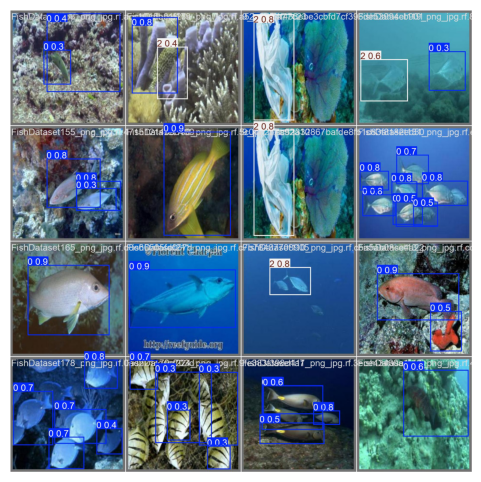

No label file for runs/detect/val2/val_batch2_labels.jpg


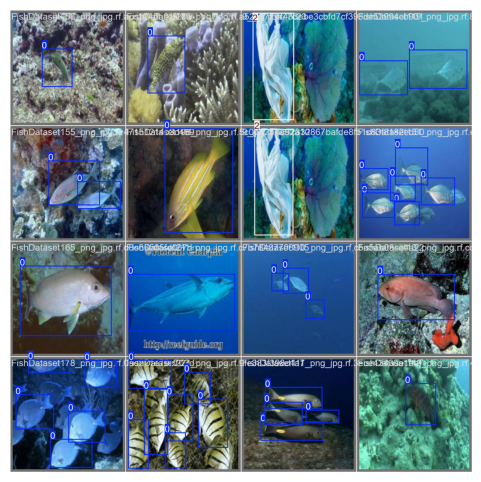

No label file for runs/detect/val2/val_batch0_pred.jpg


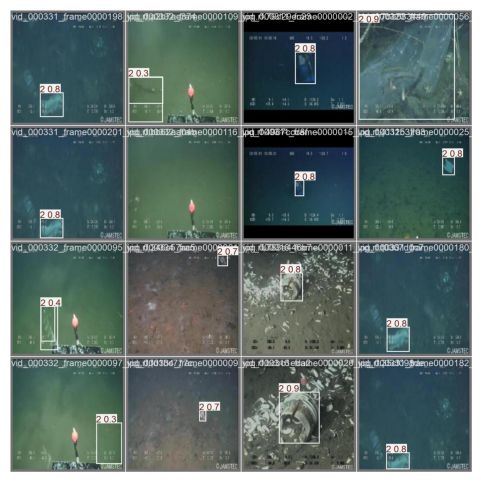

No label file for runs/detect/val2/val_batch1_pred.jpg


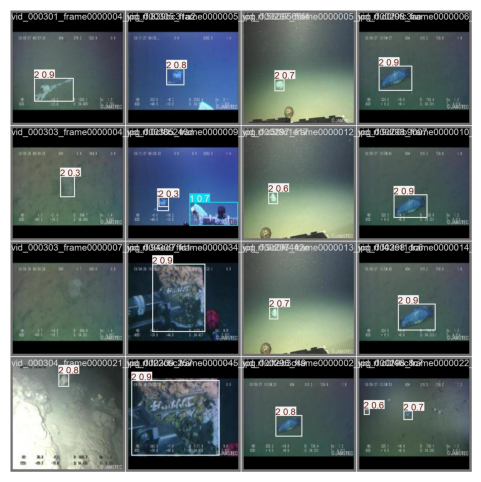

No label file for runs/detect/val2/val_batch0_labels.jpg


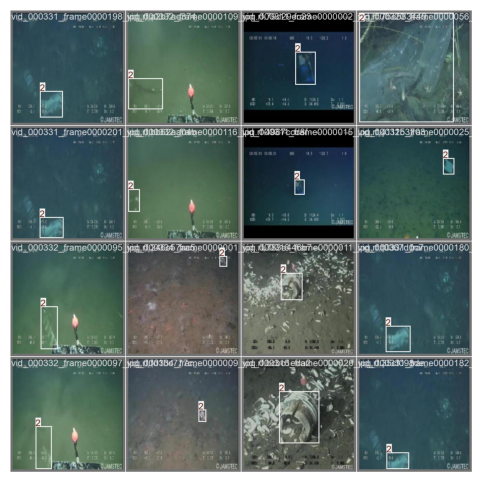

In [ ]:
import cv2
import matplotlib.pyplot as plt
import glob

# Path to predicted images
image_paths = glob.glob("runs/detect/val2/*.jpg")[:5]  # Pick any 5 images

# Class names
class_names = ["0", "1", "2"]  # Update if needed

# Loop through images
for img_path in image_paths:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Load labels from prediction files (if available)
    label_path = img_path.replace(".jpg", ".txt").replace("val2", "labels")  # Adjust path
    try:
        with open(label_path, "r") as f:
            for line in f:
                data = line.strip().split()
                class_id, x, y, w, h = map(float, data[:5])  # Read first 5 values
                class_id = int(class_id)

                # Convert YOLO format (x, y, w, h) to pixels
                h_img, w_img, _ = img.shape
                x1 = int((x - w/2) * w_img)
                y1 = int((y - h/2) * h_img)
                x2 = int((x + w/2) * w_img)
                y2 = int((y + h/2) * h_img)

                # Draw bounding box
                color = (0, 255, 0)  # Green
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

                # Add class label
                label = f"{class_names[class_id]}"
                cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    except FileNotFoundError:
        print(f"No label file for {img_path}")

    # Display image
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()


In [ ]:
!yolo val model=runs/detect/train2/weights/best.pt data=/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml save_txt=True


Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100% 1462/1462 [00:00<?, ?it/s]
val: WARNING ⚠️ /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/valid/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 92/92 [00:30<00:00,  3.04it/s]
                   all       1462       2118      0.875      0.802      0.896       0.65
                     0        323        473      0.883      0.778      0.877      0.636
                     1        225        278      0.797      0.813   

In [ ]:
!ls runs/detect/val4/labels/


10_jpg.rf.44251e9bfd3a03a724b19fbabff8b658.txt
11_png_jpg.rf.573f227d316935504e5f6dc31ee465a5.txt
13_jpg.rf.dcd77c69e670aded14fdb0528884b803.txt
14_jpeg_jpg.rf.e02549dec11f8df999db68d490b42dd0.txt
15_jpg.rf.1eb00e4bb41fb3eddd3a1c9cb5e7698b.txt
17_jpg.rf.102d74c86df110360fee3e299a1ae403.txt
1_jpg.rf.b66b2f02a9c321c107ea2f98c22a252b.txt
24_jpg.rf.2327e9a6000bf9f4ef34343efdee74ae.txt
25_jpg.rf.fef2d74a293b958727a2600a7d4e88d3.txt
27-copy-10_jpg.rf.0ccf50eb1b0bc5752f23c6b4f6900fa4.txt
2_jpg.rf.2ffd3a0bc419cebceb004cda16d98b7b.txt
2_jpg.rf.4b8a9b9b9dc8974bd8aa4af5661ee0df.txt
2_jpg.rf.7edff9cdcd4c75ca69a8792b4c7f2a31.txt
4_jpg.rf.e275278a26391e2c8298723b7a3cc78b.txt
6_jpeg_jpg.rf.8a1021f520c5e1c61015e9ebf010d1ad.txt
7_jpg.rf.dc55a09afaeebc583f59d207cc8e7367.txt
9_jpg.rf.4f433ebe3cbfd7cf396de53994cb9015.txt
9_jpg.rf.ac52332867bafde8fb1c83f8182ed503.txt
bio0000_frame0000017_jpg.rf.62d655cc3ec42af14152a5968de1c989.txt
bio0000_frame0000059_jpg.rf.eafa195c4a2791e63de1f9f947760879.txt
bio0000_fra

In [ ]:
!yolo val model=runs/detect/train2/weights/best.pt data=/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml save_txt=True


Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100% 1462/1462 [00:00<?, ?it/s]
val: WARNING ⚠️ /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/valid/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 92/92 [00:31<00:00,  2.95it/s]
                   all       1462       2118      0.875      0.802      0.896       0.65
                     0        323        473      0.883      0.778      0.877      0.636
                     1        225        278      0.797      0.813   

In [ ]:
!ls runs/detect/val6/labels/


10_jpg.rf.44251e9bfd3a03a724b19fbabff8b658.txt
11_png_jpg.rf.573f227d316935504e5f6dc31ee465a5.txt
13_jpg.rf.dcd77c69e670aded14fdb0528884b803.txt
14_jpeg_jpg.rf.e02549dec11f8df999db68d490b42dd0.txt
15_jpg.rf.1eb00e4bb41fb3eddd3a1c9cb5e7698b.txt
17_jpg.rf.102d74c86df110360fee3e299a1ae403.txt
1_jpg.rf.b66b2f02a9c321c107ea2f98c22a252b.txt
24_jpg.rf.2327e9a6000bf9f4ef34343efdee74ae.txt
25_jpg.rf.fef2d74a293b958727a2600a7d4e88d3.txt
27-copy-10_jpg.rf.0ccf50eb1b0bc5752f23c6b4f6900fa4.txt
2_jpg.rf.2ffd3a0bc419cebceb004cda16d98b7b.txt
2_jpg.rf.4b8a9b9b9dc8974bd8aa4af5661ee0df.txt
2_jpg.rf.7edff9cdcd4c75ca69a8792b4c7f2a31.txt
4_jpg.rf.e275278a26391e2c8298723b7a3cc78b.txt
6_jpeg_jpg.rf.8a1021f520c5e1c61015e9ebf010d1ad.txt
7_jpg.rf.dc55a09afaeebc583f59d207cc8e7367.txt
9_jpg.rf.4f433ebe3cbfd7cf396de53994cb9015.txt
9_jpg.rf.ac52332867bafde8fb1c83f8182ed503.txt
bio0000_frame0000017_jpg.rf.62d655cc3ec42af14152a5968de1c989.txt
bio0000_frame0000059_jpg.rf.eafa195c4a2791e63de1f9f947760879.txt
bio0000_fra

In [ ]:
!yolo val model=runs/detect/train2/weights/best.pt data=/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/data.yaml save_txt=True save_conf=True save_json=True


Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100% 1462/1462 [00:00<?, ?it/s]
val: WARNING ⚠️ /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1/utd2.v8i.yolov8/kfold_splits/fold_0/valid/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 92/92 [00:31<00:00,  2.90it/s]
                   all       1462       2118      0.875      0.802      0.896       0.65
                     0        323        473      0.883      0.778      0.877      0.636
                     1        225        278      0.797      0.813   

In [ ]:
!ls runs/detect/val7/labels/


10_jpg.rf.44251e9bfd3a03a724b19fbabff8b658.txt
11_png_jpg.rf.573f227d316935504e5f6dc31ee465a5.txt
13_jpg.rf.dcd77c69e670aded14fdb0528884b803.txt
14_jpeg_jpg.rf.e02549dec11f8df999db68d490b42dd0.txt
15_jpg.rf.1eb00e4bb41fb3eddd3a1c9cb5e7698b.txt
17_jpg.rf.102d74c86df110360fee3e299a1ae403.txt
1_jpg.rf.b66b2f02a9c321c107ea2f98c22a252b.txt
24_jpg.rf.2327e9a6000bf9f4ef34343efdee74ae.txt
25_jpg.rf.fef2d74a293b958727a2600a7d4e88d3.txt
27-copy-10_jpg.rf.0ccf50eb1b0bc5752f23c6b4f6900fa4.txt
2_jpg.rf.2ffd3a0bc419cebceb004cda16d98b7b.txt
2_jpg.rf.4b8a9b9b9dc8974bd8aa4af5661ee0df.txt
2_jpg.rf.7edff9cdcd4c75ca69a8792b4c7f2a31.txt
4_jpg.rf.e275278a26391e2c8298723b7a3cc78b.txt
6_jpeg_jpg.rf.8a1021f520c5e1c61015e9ebf010d1ad.txt
7_jpg.rf.dc55a09afaeebc583f59d207cc8e7367.txt
9_jpg.rf.4f433ebe3cbfd7cf396de53994cb9015.txt
9_jpg.rf.ac52332867bafde8fb1c83f8182ed503.txt
bio0000_frame0000017_jpg.rf.62d655cc3ec42af14152a5968de1c989.txt
bio0000_frame0000059_jpg.rf.eafa195c4a2791e63de1f9f947760879.txt
bio0000_fra

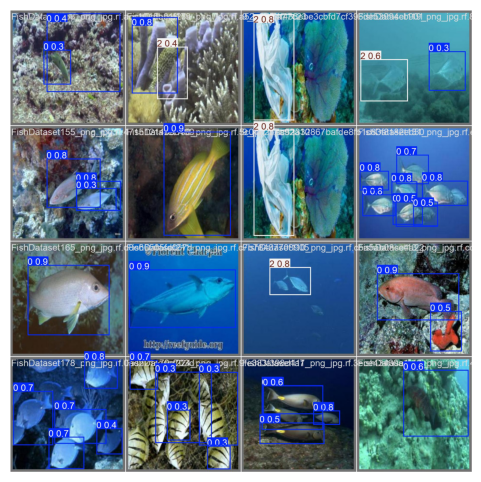

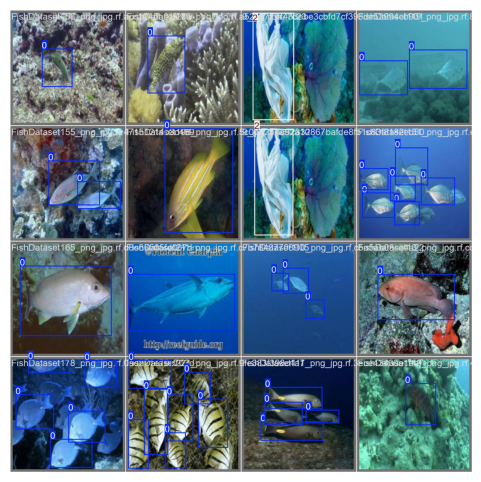

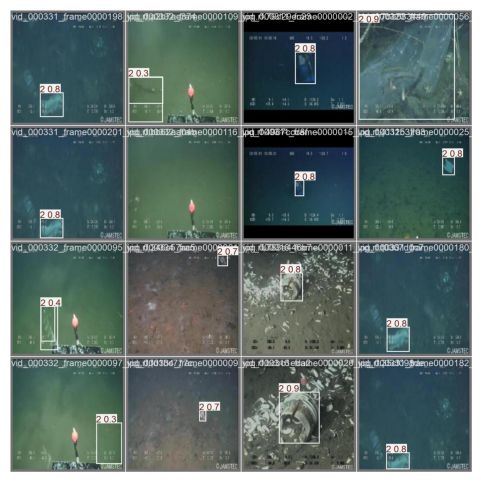

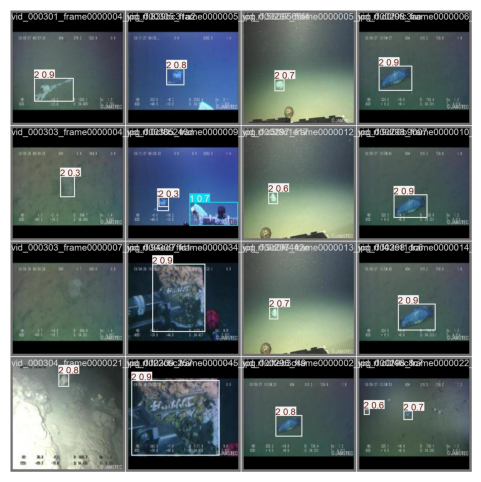

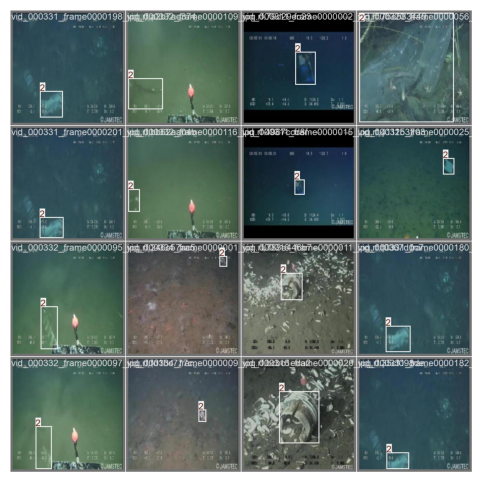

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Path to validation images and labels
image_folder = "runs/detect/val7/"
label_folder = "runs/detect/val7/labels/"

# Class names mapping (Update if necessary)
class_names = {0: "Bio", 1: "Rov", 2: "Thrash"}

# Pick 5 images
image_files = [f for f in os.listdir(image_folder) if f.endswith(".jpg")][:5]

for image_file in image_files:
    img_path = os.path.join(image_folder, image_file)
    label_path = os.path.join(label_folder, image_file.replace(".jpg", ".txt"))

    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Read label file
        # Read label file
    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f.readlines():
                print(f"Reading Label: {line.strip()}")  # Debugging print


                # Convert YOLO format (normalized) to pixel coordinates
                img_h, img_w, _ = img.shape
                x1 = int((x_center - w / 2) * img_w)
                y1 = int((y_center - h / 2) * img_h)
                x2 = int((x_center + w / 2) * img_w)
                y2 = int((y_center + h / 2) * img_h)

                # Draw bounding box and label
                color = (0, 255, 0)  # Green color for boxes
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                label = f"{class_names[class_id]} ({class_id})"
                cv2.putText(img, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Show the image with bounding boxes
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()


Label files found: ['frame_00915_png_jpg.rf.5e141a57d31170d19b2ef693b06a744f.txt', '1_jpg.rf.b66b2f02a9c321c107ea2f98c22a252b.txt', 'vid_000214_frame0000018_jpg.rf.c9950fe2182f9227aefe5b60ee6a9075.txt', 'bio0000_frame0000067_jpg.rf.28b75956b24e65bb7d1b4af4da7862bc.txt', 'infer-16_jpg.rf.0acc73b07a060244749be9ea4549c4d1.txt', 'vid_000241_frame0000010_jpg.rf.b327c9a18b2b3c72ec9944f3ecfd1647.txt', 'plastic5_jpg.rf.fb8b7601a3905805dd75269e97fe07f3.txt', 'frame_00650_png_jpg.rf.08141f8f14989ccfbce74e7c69c36958.txt', 'obj1061_frame0000113_jpg.rf.7f62576d74c652b869126eaa480bf82b.txt', 'bio0016_frame0000375_jpg.rf.9a2418a86cf13210b4330234e6a5b173.txt', 'obj1662_frame0000175_jpg.rf.05329e8e749cb210417f29fa513d55f9.txt', 'frame_00225_png_jpg.rf.4e76d3d021cac83cca47ddce62bb71e3.txt', 'frame_01100_png_jpg.rf.4dc6169a3320b2487eed99ec9cabacd6.txt', 'vid_000311_frame0000015_jpg.rf.4111b3703dd2b04635ce676043360486.txt', 'obj0310_frame0000005_jpg.rf.c2331b7e87f2ff9583f6dc8a35413bf6.txt', 'obj0002_frame

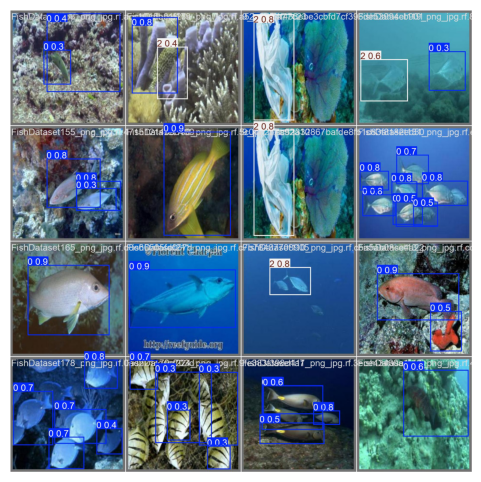

No label found for val_batch2_labels.txt, skipping.


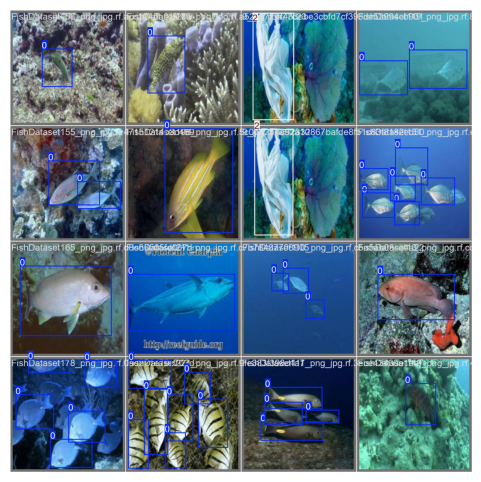

No label found for val_batch0_pred.txt, skipping.


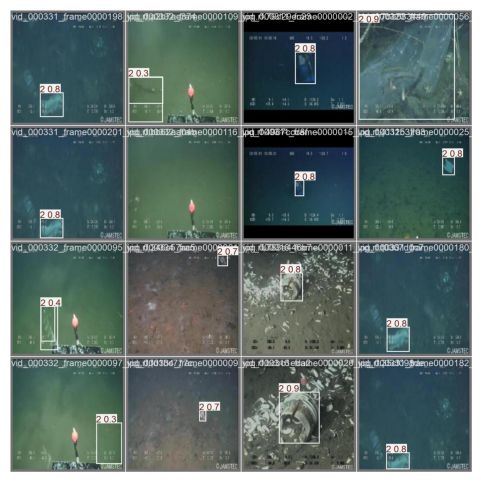

No label found for val_batch1_pred.txt, skipping.


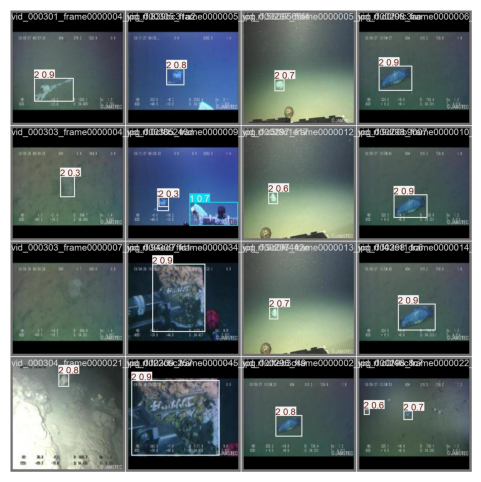

No label found for val_batch0_labels.txt, skipping.


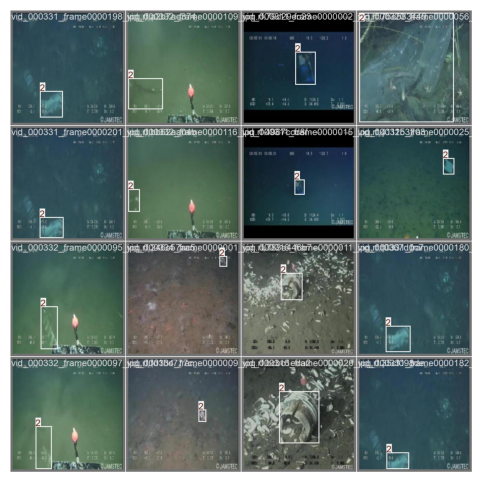

In [ ]:
import os
import cv2
import glob
import matplotlib.pyplot as plt

# Define paths
image_folder = "runs/detect/val7"  # Change this if needed
label_folder = os.path.join(image_folder, "labels")

# Get 5 predicted images
image_paths = glob.glob(os.path.join(image_folder, "*.jpg"))[:5]

# Check if label folder exists
if not os.path.exists(label_folder):
    print(f"Label folder not found: {label_folder}")
else:
    print("Label files found:", os.listdir(label_folder))

# Class names mapping
class_names = {0: "Class 0", 1: "Class 1", 2: "Class 2"}

# Display images with bounding boxes
for img_path in image_paths:
    img_name = os.path.basename(img_path).replace(".jpg", ".txt")
    label_path = os.path.join(label_folder, img_name)

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) < 5:
                    continue  # Skip incorrect format

                class_id, x_center, y_center, width, height = map(float, parts)
                class_id = int(class_id)

                # Convert from YOLO format to pixel coordinates
                h, w, _ = img.shape
                x1 = int((x_center - width / 2) * w)
                y1 = int((y_center - height / 2) * h)
                x2 = int((x_center + width / 2) * w)
                y2 = int((y_center + height / 2) * h)

                # Draw bounding box
                color = (255, 0, 0)  # Red color
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

                # Put label
                label = class_names.get(class_id, str(class_id))
                cv2.putText(img, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

                print(f"Image: {img_path}, Label: {label}, Box: ({x1}, {y1}), ({x2}, {y2})")

    else:
        print(f"No label found for {img_name}, skipping.")

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()


In [ ]:
import os

label_folder = "runs/detect/val7/labels"  # Change if needed

if not os.path.exists(label_folder):
    print(f"❌ Label folder does not exist: {label_folder}")
else:
    label_files = os.listdir(label_folder)
    if label_files:
        print(f"✅ Found {len(label_files)} label files:", label_files[:5])  # Print first 5
    else:
        print("❌ No label files found!")


✅ Found 1462 label files: ['frame_00915_png_jpg.rf.5e141a57d31170d19b2ef693b06a744f.txt', '1_jpg.rf.b66b2f02a9c321c107ea2f98c22a252b.txt', 'vid_000214_frame0000018_jpg.rf.c9950fe2182f9227aefe5b60ee6a9075.txt', 'bio0000_frame0000067_jpg.rf.28b75956b24e65bb7d1b4af4da7862bc.txt', 'infer-16_jpg.rf.0acc73b07a060244749be9ea4549c4d1.txt']


In [ ]:
sample_label_file = os.path.join(label_folder, os.listdir(label_folder)[0])  # Pick first file

with open(sample_label_file, "r") as f:
    print(f"📄 Contents of {sample_label_file}:")
    print(f.read())


📄 Contents of runs/detect/val7/labels/frame_00915_png_jpg.rf.5e141a57d31170d19b2ef693b06a744f.txt:
2 0.533381 0.425654 0.0863566 0.0929138 0.349361
2 0.782982 0.8134 0.428684 0.36851 0.191736
2 0.53281 0.437222 0.0983814 0.119146 0.148538
2 0.534491 0.417326 0.0783325 0.0682133 0.0577733
2 0.524795 0.433582 0.0708225 0.101825 0.0365044
2 0.535401 0.447167 0.12304 0.142756 0.0320871
2 0.476439 0.445482 0.0529398 0.0796553 0.0127286
2 0.536116 0.495443 0.142901 0.250176 0.0116733
2 0.519311 0.591133 0.145886 0.471309 0.0104643
2 0.51959 0.463045 0.15644 0.170936 0.00897171
2 0.435505 0.443545 0.143168 0.107726 0.00789696
2 0.491557 0.451033 0.227034 0.127437 0.00782389
2 0.522959 0.462344 0.0897543 0.149018 0.00774618
2 0.512182 0.442993 0.0653921 0.127767 0.00773015
2 0.555194 0.442889 0.172578 0.140983 0.00748121
2 0.49495 0.441865 0.0648283 0.105752 0.00680633
2 0.499979 0.468468 0.0727338 0.152411 0.00613476
2 0.578816 0.442321 0.0797027 0.108917 0.00547869
2 0.448046 0.445079 0.1068

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

image_folder = "runs/detect/val7/predictions"  # Update if needed
label_folder = "runs/detect/val7/labels"       # Update if needed
class_names = ["0", "1", "2"]  # Update with your actual class names if available

# Get sample images
image_files = [f for f in os.listdir(image_folder) if f.endswith(".jpg")][:5]

for img_file in image_files:
    img_path = os.path.join(image_folder, img_file)
    label_path = os.path.join(label_folder, os.path.splitext(img_file)[0] + ".txt")

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f.readlines():
                data = list(map(float, line.split()))
                class_id, x_center, y_center, width, height, _ = data  # Ignore confidence

                h, w, _ = img.shape
                x1, y1 = int((x_center - width / 2) * w), int((y_center - height / 2) * h)
                x2, y2 = int((x_center + width / 2) * w), int((y_center + height / 2) * h)

                cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(img, f"{class_names[int(class_id)]}", (x1, y1 - 5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'runs/detect/val7/predictions'

In [ ]:
import os
os.listdir("runs/detect/train")


FileNotFoundError: [Errno 2] No such file or directory: 'runs/detect/train'